In [1]:
import os
import re

import faiss
import matplotlib.pyplot as plt
import nltk
import numpy as np
import optuna
import pandas as pd
import polars as pl
import requests
import spacy
import torch
import torch.nn.functional as F
from nltk.corpus import stopwords
from PIL import Image, UnidentifiedImageError
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import normalize
from tqdm import tqdm
from transformers import BertModel, BertTokenizerFast

tqdm.pandas()
os.environ["TOKENIZERS_PARALLELISM"] = "false"

# Load spaCy model for English
nlp = spacy.load("en_core_web_sm")

# Load English stopwords from spaCy
spacy_stop_words = nlp.Defaults.stop_words

# Download NLTK stopwords
nltk.download("stopwords")
nltk_stop_words = set(stopwords.words("english"))

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/timofeytkachenko/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
stop_words = spacy_stop_words.union(nltk_stop_words)
stop_words = set(word.lower() for word in stop_words)
len(stop_words)

382

In [3]:
DATASET_PATH = "data/imdb_movies.parquet"
DATASET_WITH_EMBEDDINGS_PATH = "data/imdb_movies_embeddings.parquet"
SUBMISSION_PATH = "data/submission.parquet"
RELEVANT_TITLES_PATH = "data/relevant_titles_subsample.parquet"
FEATURES_PATH = "data/features.npy"
OPTUNADB = "data/db.sqlite3_simple_recsys"

In [4]:
def clean_text(text: str) -> str:
    """
    Cleans the input text by removing non-alphanumeric characters, replacing sequences
    of whitespace with a single space, and converting the text to lowercase.

    This function preserves alphanumeric characters and whitespace, but removes punctuation
    and special characters (except for diacritical marks, which are treated as part of
    alphanumeric characters). It also ensures that only one space separates words and trims
    leading and trailing spaces.

    Parameters
    ----------
    text : str
        The input text to be cleaned.

    Returns
    -------
    str
        The cleaned text with only alphanumeric characters and spaces, converted to lowercase,
        and with one space between words.
    """
    # Replace all non-alphanumeric characters (excluding diacritical marks) with a single space
    cleaned_text = re.sub(r"[^\w\s]", " ", text)

    # Replace multiple spaces with a single space
    cleaned_text = re.sub(r"\s+", " ", cleaned_text)

    # Convert to lowercase and strip leading/trailing whitespace
    return cleaned_text.lower().strip()


def preprocessing(df: pd.DataFrame, column_name: str) -> pd.Series:
    """
    Cleans a specified column in the DataFrame by removing special characters,
    extra whitespace, newlines, and tabs.

    Parameters
    ----------
    df : pd.DataFrame
        The DataFrame containing the text data.
    column_name : str
        The column name containing text to be cleaned.

    Returns
    -------
    pd.Series
        A cleaned column of the DataFrame.
    """
    # Apply the clean_text function to each element in the specified column
    return df[column_name].apply(lambda x: clean_text(x) if isinstance(x, str) else x)


def keywords_preprocessing(df: pd.DataFrame, column_name: str) -> pd.Series:
    """
    Cleans a specified column in the DataFrame by removing special characters,
    extra whitespace, newlines, and tabs.

    Parameters
    ----------
    df : pd.DataFrame
        The DataFrame containing the text data.
    column_name : str
        The column name containing text to be cleaned.

    Returns
    -------
    pd.Series
        A cleaned column of the DataFrame.
    """
    return df[column_name].progress_apply(
        lambda x: [clean_text(kw) for kw in x] if isinstance(x, np.ndarray) else x
    )


def join_array_to_string_column(df: pd.DataFrame, column_name: str) -> str:
    """
    Converts an array of strings to a single string.

    Parameters
    ----------
    df : pd.DataFrame
        The DataFrame containing the text data.
    column_name : str
        The column name containing text to be cleaned.

    Returns
    -------
    pd.Series
        A cleaned column of the DataFrame.
    """
    return df[column_name].progress_apply(lambda x: " ".join(x).strip())


def get_neighbors_by_title_id(
    index_row: np.ndarray[int], title_ids: np.ndarray[int]
) -> np.ndarray[int]:
    """
    Get the neighbors of a given title based on its index in the title_ids array.

    Parameters
    ----------
    index_row : np.ndarray[int]
        The index of the title in the title_ids array.
    title_ids : np.ndarray[int]
        The array of title IDs.

    Returns
    -------
    np.ndarray[int]
        The indices of the neighbors of the given title in the title_ids array.
    """
    return title_ids[index_row]


def get_embedding(
    text: str, tokenizer: BertTokenizerFast, model: BertModel
) -> np.ndarray[float]:
    """
    Extracts the embeddings for the input text using the pre-trained BERT model.

    Parameters
    ----------
    text : str
        The input text to be converted to embeddings.
    tokenizer : BertTokenizerFast
        Tokenizer to convert text into tokens.
    model : BertModel
        Pre-trained model to generate embeddings.

    Returns
    -------
    np.ndarray[float]
        The embeddings for the input text.
    """
    # Set the text to an empty string if it is None
    text = text if text is not None else ""

    # Tokenize the input text
    inputs = tokenizer(
        text,
        return_tensors="pt",
        padding=True,
        truncation=True,
        add_special_tokens=True,
    )

    # Generate the embeddings
    with torch.no_grad():
        outputs = model(**inputs)

        # Extract hidden states (assuming the model has output_hidden_states=True)
        hidden_states = outputs.hidden_states

    # Take the second-to-last hidden layer
    token_vecs = hidden_states[-2][0]  # Shape: [sequence_length, hidden_size]

    # Calculate the mean of all token vectors (sentence embedding)
    sentence_embedding = torch.mean(token_vecs, dim=0)

    return normalize(
        sentence_embedding.cpu().detach().numpy().reshape(1, -1), norm="l2", axis=1
    ).reshape(-1)


def get_st_embedding(
    text: str, tokenizer: BertTokenizerFast, model: BertModel
) -> np.ndarray[float]:
    """
    Extracts the embeddings for the input text using the pre-trained BERT model.

    Parameters
    ----------
    text : str
        The input text to be converted to embeddings.
    tokenizer : AutoTokenizer
        Tokenizer to convert text into tokens.
    model : AutoModel
        Pre-trained model to generate embeddings.

    Returns
    -------
    np.ndarray[float]
        The embeddings for the input text.
    """

    # Mean Pooling - Take attention mask into account for correct averaging
    def mean_pooling(model_output, attention_mask):
        token_embeddings = model_output[
            0
        ]  # First element of model_output contains all token embeddings
        input_mask_expanded = (
            attention_mask.unsqueeze(-1).expand(token_embeddings.size()).float()
        )
        return torch.sum(token_embeddings * input_mask_expanded, 1) / torch.clamp(
            input_mask_expanded.sum(1), min=1e-9
        )

    # Set the text to an empty string if it is None
    text = text if text is not None else ""

    # Tokenize sentences
    encoded_input = tokenizer(text, padding=True, truncation=True, return_tensors="pt")

    # Compute token embeddings
    with torch.no_grad():
        model_output = model(**encoded_input)

    # Perform pooling
    sentence_embeddings = mean_pooling(model_output, encoded_input["attention_mask"])

    # Normalize embeddings
    sentence_embeddings = F.normalize(sentence_embeddings, p=2, dim=1)

    return sentence_embeddings.cpu().detach().numpy()


def hitrate(y_relevant: list[str], y_preds: list[str], k: int = 10) -> int:
    return int(len(set(y_relevant).intersection(y_preds[:k])) > 0)


def get_score(TOP_K: int = 10):
    hitrate_list = []
    user_preds = {
        title_id: recs for title_id, recs in pl.read_parquet(SUBMISSION_PATH).rows()
    }
    for title_id, relevant_items in pl.read_parquet(RELEVANT_TITLES_PATH).rows():
        recommended_titles = user_preds.get(title_id, [])[:TOP_K]
        hitrate_list.append(hitrate(relevant_items, recommended_titles, k=TOP_K))

    mean_hitrate = float(np.mean(hitrate_list))
    return mean_hitrate


def custom_tokenizer(text: str):
    """
    Tokenizes the input text, preserves words with underscores as single tokens,
    performs lemmatization using spaCy, and removes stop words.

    Parameters
    ----------
    text : str
        The input text to be processed.

    Returns
    -------
    list[str]
        A list of lemmatized tokens with stop words removed.
    """
    # Process the text with spaCy (tokenization, POS tagging, and lemmatization)
    doc = nlp(text)

    # Lemmatize words, remove stop words, and preserve words with underscores
    tokens = [token.lemma_.lower() for token in doc if token.lemma_ not in stop_words]

    return tokens


def concatenate_arrays_in_columns(df: pd.DataFrame, columns: list) -> pd.Series:
    """
    Merge arrays from specified columns in the DataFrame, ignoring NaN values.

    Parameters
    ----------
    df : pd.DataFrame
        The DataFrame containing arrays in specific columns.
    columns : list
        The list of column names to merge arrays from.

    Returns
    -------
    pd.Series
        A Series with merged arrays from the specified columns.
    """
    # Apply the merge operation row-wise
    return df[columns].progress_apply(
        lambda row: (
            np.concatenate([x for x in row if isinstance(x, np.ndarray)])
            if any(isinstance(x, np.ndarray) for x in row)
            else np.array([])
        ),
        axis=1,
    )


def merge_str_columns(df: pd.DataFrame, columns: list) -> pd.Series:
    """
    Merge strings from specified columns in the DataFrame, ignoring NaN values.

    Parameters
    ----------
    df : pd.DataFrame
        The DataFrame containing strings in specific columns.
    columns : list
        The list of column names to merge strings from.

    Returns
    -------
    pd.Series
        A Series with merged strings from the specified columns.
    """
    # Apply the merge operation row-wise
    return df[columns].progress_apply(
        lambda row: " ".join([str(x) for x in row if isinstance(x, str)]).strip(),
        axis=1,
    )


def replace_spaces_in_ngrams(df: pd.DataFrame, columns: list) -> pd.DataFrame:
    """
    Replace spaces with underscores in n-grams for specified columns in the DataFrame.

    Parameters
    ----------
    df : pd.DataFrame
        The DataFrame containing the n-grams.
    columns : list
        The list of columns where n-grams are present.

    Returns
    -------
    pd.DataFrame
        The updated DataFrame with spaces replaced by underscores in n-grams.
    """
    # Apply the operation to each specified column
    for column in columns:
        df[column] = df[column].apply(
            lambda str_array: (
                np.array([keyword.replace(" ", "_") for keyword in str_array])
                if str_array is not None
                else np.array([])
            )
        )

    return df

In [5]:
movies_df = pd.read_parquet(DATASET_PATH)

movies_df.head()

,title_id,poster_url,type,name,original_name,description,genre,date,rating_count,rating_value,keywords,featured_review,stars,directors,creators
0,tt0111161,https://m.media-amazon.com/images/M/MV5BNDE3OD...,Movie,Побег из Шоушенка,The Shawshank Redemption,"Over the course of several years, two convicts...",[Drama],1994-10-14,2755277.0,9.3,"[prison, based on the works of stephen king, e...",It is no wonder that the film has such a high ...,"[Tim Robbins, Morgan Freeman, Bob Gunton]",[Frank Darabont],"[Stephen King, Frank Darabont]"
1,tt0068646,https://m.media-amazon.com/images/M/MV5BM2MyNj...,Movie,Крестный отец,The Godfather,"Don Vito Corleone, head of a mafia family, dec...","[Crime, Drama]",1972-03-24,1917037.0,9.2,"[mafia, patriarch, crime family, organized cri...",I love this movie and all of the GF movies. I ...,"[Marlon Brando, Al Pacino, James Caan]",[Francis Ford Coppola],"[Mario Puzo, Francis Ford Coppola]"
2,tt0468569,https://m.media-amazon.com/images/M/MV5BMTMxNT...,Movie,Тёмный рыцарь,The Dark Knight,When the menace known as the Joker wreaks havo...,"[Action, Crime, Drama]",2008-08-14,2728169.0,9.0,"[dc comics, psychopath, moral dilemma, superhe...","If someone else acted as Joker, I would give t...","[Christian Bale, Heath Ledger, Aaron Eckhart]",[Christopher Nolan],"[Jonathan Nolan, Christopher Nolan, David S. G..."
3,tt0050083,https://m.media-amazon.com/images/M/MV5BMWU4N2...,Movie,12 разгневанных мужчин,12 Angry Men,The jury in a New York City murder trial is fr...,"[Crime, Drama]",1961-11-13,816234.0,9.0,"[jury, dialogue driven, courtroom, trial, jury...",&apos;12 Angry Men&apos; is an outstanding fil...,"[Henry Fonda, Lee J. Cobb, Martin Balsam]",[Sidney Lumet],[Reginald Rose]
4,tt0071562,https://m.media-amazon.com/images/M/MV5BMWMwMG...,Movie,Крестный отец 2,The Godfather Part II,The early life and career of Vito Corleone in ...,"[Crime, Drama]",1974-12-18,1305122.0,9.0,"[revenge, 1950s, corrupt politician, cuban rev...",The original Godfather is a brilliant work. It...,"[Al Pacino, Robert De Niro, Robert Duvall]",[Francis Ford Coppola],"[Francis Ford Coppola, Mario Puzo]"


In [6]:
movies_df["description"] = preprocessing(movies_df, "description")
movies_df["featured_review"] = preprocessing(movies_df, "featured_review")

In [7]:
features_to_concat = ["keywords", "genre", "stars", "directors", "creators"]
movies_df["combined_feature"] = concatenate_arrays_in_columns(
    movies_df, features_to_concat
)
movies_df["combined_feature"] = keywords_preprocessing(movies_df, "combined_feature")
movies_df["combined_feature"] = join_array_to_string_column(
    movies_df, "combined_feature"
)

100%|██████████| 9798/9798 [00:00<00:00, 1525003.36it/s]


In [8]:
movies_df.head()

,title_id,poster_url,type,name,original_name,description,genre,date,rating_count,rating_value,keywords,featured_review,stars,directors,creators,combined_feature
0,tt0111161,https://m.media-amazon.com/images/M/MV5BNDE3OD...,Movie,Побег из Шоушенка,The Shawshank Redemption,over the course of several years two convicts ...,[Drama],1994-10-14,2755277.0,9.3,"[prison, based on the works of stephen king, e...",it is no wonder that the film has such a high ...,"[Tim Robbins, Morgan Freeman, Bob Gunton]",[Frank Darabont],"[Stephen King, Frank Darabont]",prison based on the works of stephen king esca...
1,tt0068646,https://m.media-amazon.com/images/M/MV5BM2MyNj...,Movie,Крестный отец,The Godfather,don vito corleone head of a mafia family decid...,"[Crime, Drama]",1972-03-24,1917037.0,9.2,"[mafia, patriarch, crime family, organized cri...",i love this movie and all of the gf movies i s...,"[Marlon Brando, Al Pacino, James Caan]",[Francis Ford Coppola],"[Mario Puzo, Francis Ford Coppola]",mafia patriarch crime family organized crime r...
2,tt0468569,https://m.media-amazon.com/images/M/MV5BMTMxNT...,Movie,Тёмный рыцарь,The Dark Knight,when the menace known as the joker wreaks havo...,"[Action, Crime, Drama]",2008-08-14,2728169.0,9.0,"[dc comics, psychopath, moral dilemma, superhe...",if someone else acted as joker i would give th...,"[Christian Bale, Heath Ledger, Aaron Eckhart]",[Christopher Nolan],"[Jonathan Nolan, Christopher Nolan, David S. G...",dc comics psychopath moral dilemma superhero c...
3,tt0050083,https://m.media-amazon.com/images/M/MV5BMWU4N2...,Movie,12 разгневанных мужчин,12 Angry Men,the jury in a new york city murder trial is fr...,"[Crime, Drama]",1961-11-13,816234.0,9.0,"[jury, dialogue driven, courtroom, trial, jury...",apos 12 angry men apos is an outstanding film ...,"[Henry Fonda, Lee J. Cobb, Martin Balsam]",[Sidney Lumet],[Reginald Rose],jury dialogue driven courtroom trial jury room...
4,tt0071562,https://m.media-amazon.com/images/M/MV5BMWMwMG...,Movie,Крестный отец 2,The Godfather Part II,the early life and career of vito corleone in ...,"[Crime, Drama]",1974-12-18,1305122.0,9.0,"[revenge, 1950s, corrupt politician, cuban rev...",the original godfather is a brilliant work it ...,"[Al Pacino, Robert De Niro, Robert Duvall]",[Francis Ford Coppola],"[Francis Ford Coppola, Mario Puzo]",revenge 1950s corrupt politician cuban revolut...


In [9]:
# Load the pre-trained BERT fast tokenizer
tokenizer = BertTokenizerFast.from_pretrained(
    "bert-base-uncased", clean_up_tokenization_spaces=True
)

# Load the pre-trained BERT model with the hidden states output
model = BertModel.from_pretrained("bert-base-uncased", output_hidden_states=True)

# Put the model in "evaluation" mode, meaning feed-forward operation.
model.eval()

BertModel(
  (embeddings): BertEmbeddings(
    (word_embeddings): Embedding(30522, 768, padding_idx=0)
    (position_embeddings): Embedding(512, 768)
    (token_type_embeddings): Embedding(2, 768)
    (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
    (dropout): Dropout(p=0.1, inplace=False)
  )
  (encoder): BertEncoder(
    (layer): ModuleList(
      (0-11): 12 x BertLayer(
        (attention): BertAttention(
          (self): BertSdpaSelfAttention(
            (query): Linear(in_features=768, out_features=768, bias=True)
            (key): Linear(in_features=768, out_features=768, bias=True)
            (value): Linear(in_features=768, out_features=768, bias=True)
            (dropout): Dropout(p=0.1, inplace=False)
          )
          (output): BertSelfOutput(
            (dense): Linear(in_features=768, out_features=768, bias=True)
            (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
            (dropout): Dropout(p=0.1, inplace=False

In [10]:
# Initialize the TF-IDF vectorizer
vectorizer = TfidfVectorizer(stop_words="english")

# Fit the vectorizer on the combined feature text
vectorizer.fit(movies_df["combined_feature"])

# Get the number of features in the TF-IDF vectorizer
n_features = len(vectorizer.get_feature_names_out())

In [11]:
text = movies_df["description"][0]
text

'over the course of several years two convicts form a friendship seeking consolation and eventually redemption through basic compassion'

In [12]:
test_embedding = get_embedding(text, tokenizer, model)
test_embedding

array([-1.33655674e-03,  5.03364466e-02,  1.02817612e-02, -1.95518434e-02,
        3.91736142e-02,  1.29627744e-02,  3.73589508e-02,  1.23640196e-02,
        2.43917704e-02, -3.99483070e-02,  2.84238011e-02, -1.10834884e-02,
        2.56795455e-02,  3.52510884e-02,  1.76501852e-02,  4.57443818e-02,
        1.51088424e-02, -5.56172512e-04,  1.17076365e-02,  3.97093184e-02,
       -3.45712737e-03, -6.34467090e-03, -4.34431769e-02,  3.92220020e-02,
        3.39607745e-02,  2.08944529e-02,  1.24704055e-02, -2.04799324e-02,
       -3.24435979e-02,  4.32891808e-02,  3.69914025e-02, -9.48246161e-04,
        2.52578920e-03, -2.28051357e-02, -3.05191316e-02,  2.99216472e-02,
        7.94912502e-03,  2.84288172e-02,  1.59844626e-02,  3.98182217e-03,
        4.14466821e-02, -6.49418775e-03,  1.15928492e-02, -1.64190158e-02,
        3.10461186e-02, -4.34526280e-02,  1.72574501e-02, -4.20505591e-02,
       -2.61011980e-02, -1.71221569e-02, -4.34210896e-02, -1.04360683e-02,
        3.47960219e-02, -

In [13]:
test_embedding.shape

(768,)

In [14]:
text = movies_df["combined_feature"][0]
text

'prison based on the works of stephen king escape from prison friendship between men voice over narration drama tim robbins morgan freeman bob gunton frank darabont stephen king frank darabont'

In [15]:
tfidf_vector = vectorizer.transform([text])
tfidf_vector.shape

(1, 30111)

In [16]:
tokens = vectorizer.inverse_transform(tfidf_vector)
tokens

[array(['based', 'bob', 'darabont', 'drama', 'escape', 'frank', 'freeman',
        'friendship', 'gunton', 'king', 'men', 'morgan', 'narration',
        'prison', 'robbins', 'stephen', 'tim', 'voice', 'works'],
       dtype='<U18')]

In [17]:
if os.path.exists(FEATURES_PATH):
    with open(FEATURES_PATH, "rb") as f:
        features_mat = np.load(f)
else:
    description_embeddings = movies_df["description"].progress_apply(
        lambda text: get_embedding(text, tokenizer, model)
    )
    featured_review_embeddings = movies_df["featured_review"].progress_apply(
        lambda text: get_embedding(text, tokenizer, model)
    )
    combined_feature_embeddings = movies_df["combined_feature"].progress_apply(
        lambda text: get_embedding(text, tokenizer, model)
    )
    description_embeddings = np.vstack(description_embeddings)
    featured_review_embeddings = np.vstack(featured_review_embeddings)
    combined_feature_embeddings = np.vstack(combined_feature_embeddings)
    features_mat = np.concatenate(
        [
            description_embeddings,
            featured_review_embeddings,
            combined_feature_embeddings,
        ],
        axis=1,
    )
    with open(FEATURES_PATH, "wb") as f:
        np.save(f, features_mat, allow_pickle=True)

100%|██████████| 9798/9798 [06:36<00:00, 24.73it/s]


In [18]:
max_features = [n_features // i for i in range(1, 6)]
max_features

[30111, 15055, 10037, 7527, 6022]

In [19]:
def objective(trial):
    n_max = trial.suggest_int("n_max", 1, 3)
    tfidf_params = {
        "max_features": trial.suggest_int("max_features", 10000, n_features),
        "ngram_range": (1, n_max),
        "use_idf": trial.suggest_categorical("use_idf", [True, False]),
        "sublinear_tf": trial.suggest_categorical("sublinear_tf", [True, False]),
        "max_df": trial.suggest_float("max_df", 0.9, 1),
        "strip_accents": trial.suggest_categorical(
            "strip_accents", ["ascii", "unicode", None]
        ),
        "token_pattern": r"(?u)\b\w+\b",
        "stop_words": "english",
    }

    # Initialize TF-IDF vectorizer
    vectorizer = TfidfVectorizer(**tfidf_params)

    # Fit the vectorizer on the cleaned text data
    tfidf_features = vectorizer.fit_transform(movies_df["combined_feature"])

    # Add the TF-IDF embeddings to the features matrix
    optuna_features_mat = np.concatenate(
        [features_mat, tfidf_features.toarray()], axis=1
    )

    # Ensure features_mat is a numpy array of dtype float32
    optuna_features_mat = np.asarray(optuna_features_mat, dtype=np.float32)

    # Set hyperparameters for Faiss index
    n_neighbors = 10
    d = optuna_features_mat.shape[1]
    k = n_neighbors + 1

    # Normalize features with faiss.normalize_L2
    faiss.normalize_L2(optuna_features_mat)

    # Create the FAISS index for inner product search (cosine similarity after normalization)
    index = faiss.IndexFlatL2(d)

    # Add the normalized features to the index
    index.add(optuna_features_mat)

    # Perform a search for the nearest neighbors
    D, I = index.search(optuna_features_mat, k)
    D, I = D[:, 1:], I[:, 1:]

    # Add a new column with title_ids of the nearest neighbors
    movies_df["recs"] = I.tolist()
    movies_df["recs"] = movies_df["recs"].progress_apply(
        lambda recs: get_neighbors_by_title_id(recs, movies_df["title_id"].values)
    )

    # Create a DataFrame with title_id and recommendations
    recs_df = movies_df[["title_id", "recs"]]
    recs_df.to_parquet(SUBMISSION_PATH)

    return get_score(TOP_K=10)


if os.path.exists(OPTUNADB):
    os.remove(OPTUNADB)

# Create a Study object and optimize the objective function
study = optuna.create_study(
    storage="sqlite:///" + OPTUNADB,  # Specify the storage URL here.
    study_name="simple_recsys",
    direction="maximize",
)

# Run the Optimization Process
study.optimize(objective, n_trials=200)

# # Grid Search
# search_space = {
#     "n_max": list(range(1, 4)),
#     "max_df": [0.9, 0.95, 1],
#     "max_features": max_features,
#     "use_idf": [True, False],
#     "sublinear_tf": [True, False],
#     "strip_accents": ["ascii", "unicode", None],
# }
# n_trials = np.prod([len(v) for k,v in search_space.items()])
# print(f"Number of trials: {n_trials}")

# study = optuna.create_study(sampler=optuna.samplers.GridSampler(search_space), direction="maximize")
# study.optimize(objective, n_trials=n_trials)

[I 2024-10-12 23:20:00,591] A new study created in RDB with name: simple_recsys
100%|██████████| 9798/9798 [00:00<00:00, 157246.08it/s]
[I 2024-10-12 23:20:12,741] Trial 0 finished with value: 0.247 and parameters: {'n_max': 2, 'max_features': 12664, 'use_idf': False, 'sublinear_tf': True, 'max_df': 0.9009850156383855, 'strip_accents': None}. Best is trial 0 with value: 0.247.
100%|██████████| 9798/9798 [00:00<00:00, 163003.50it/s]
[I 2024-10-12 23:20:26,913] Trial 1 finished with value: 0.257 and parameters: {'n_max': 2, 'max_features': 15588, 'use_idf': True, 'sublinear_tf': False, 'max_df': 0.9877136680730839, 'strip_accents': 'ascii'}. Best is trial 1 with value: 0.257.
100%|██████████| 9798/9798 [00:00<00:00, 244864.12it/s]
[I 2024-10-12 23:20:47,648] Trial 2 finished with value: 0.247 and parameters: {'n_max': 1, 'max_features': 24063, 'use_idf': True, 'sublinear_tf': False, 'max_df': 0.966367891879708, 'strip_accents': None}. Best is trial 1 with value: 0.257.
100%|██████████| 9

In [20]:
study.best_params

{'n_max': 2,
 'max_features': 27222,
 'use_idf': True,
 'sublinear_tf': True,
 'max_df': 0.9251907667664511,
 'strip_accents': 'unicode'}

In [21]:
best_params = study.best_params
best_params["ngram_range"] = (1, best_params.pop("n_max"))
best_params["stop_words"] = "english"
best_params["strip_accents"] = "unicode"
best_params["token_pattern"] = r"(?u)\b\w+\b"
best_params

{'max_features': 27222,
 'use_idf': True,
 'sublinear_tf': True,
 'max_df': 0.9251907667664511,
 'strip_accents': 'unicode',
 'ngram_range': (1, 2),
 'stop_words': 'english',
 'token_pattern': '(?u)\\b\\w+\\b'}

In [22]:
# Initialize TF-IDF vectorizer with the best hyperparameters
vectorizer = TfidfVectorizer(**best_params)
tfidf_features = vectorizer.fit_transform(movies_df["combined_feature"])

In [23]:
# Add the TF-IDF embeddings to the features matrix
final_features = np.concatenate([features_mat, tfidf_features.toarray()], axis=1)

In [24]:
final_features.shape

(9798, 29526)

In [25]:
# Set hyperparameters for Faiss index
n_neighbors = 10
d = final_features.shape[1]
print(f"Number of features: {d}")
k = n_neighbors + 1

# Ensure features_mat is a numpy array of dtype float32
final_features = np.asarray(final_features, dtype=np.float32)

# Normalize features with faiss.normalize_L2
faiss.normalize_L2(final_features)

# Create the FAISS index for inner product search (cosine similarity after normalization)
index = faiss.IndexFlatL2(d)

# Add the normalized features to the index
index.add(final_features)

Number of features: 29526


In [26]:
# Perform a search for the nearest neighbors
D, I = index.search(final_features, k)
D, I = D[:, 1:], I[:, 1:]
D.shape, I.shape

((9798, 10), (9798, 10))

In [27]:
# Add a new column with title_ids of the nearest neighbors
movies_df["recs"] = I.tolist()
movies_df["recs"] = movies_df["recs"].progress_apply(
    lambda recs: get_neighbors_by_title_id(recs, movies_df["title_id"].values)
)

100%|██████████| 9798/9798 [00:00<00:00, 211610.36it/s]


In [28]:
movies_df.head()

,title_id,poster_url,type,name,original_name,description,genre,date,rating_count,rating_value,keywords,featured_review,stars,directors,creators,combined_feature,recs
0,tt0111161,https://m.media-amazon.com/images/M/MV5BNDE3OD...,Movie,Побег из Шоушенка,The Shawshank Redemption,over the course of several years two convicts ...,[Drama],1994-10-14,2755277.0,9.3,"[prison, based on the works of stephen king, e...",it is no wonder that the film has such a high ...,"[Tim Robbins, Morgan Freeman, Bob Gunton]",[Frank Darabont],"[Stephen King, Frank Darabont]",prison based on the works of stephen king esca...,"[tt0884328, tt0120689, tt0118460, tt5606664, t..."
1,tt0068646,https://m.media-amazon.com/images/M/MV5BM2MyNj...,Movie,Крестный отец,The Godfather,don vito corleone head of a mafia family decid...,"[Crime, Drama]",1972-03-24,1917037.0,9.2,"[mafia, patriarch, crime family, organized cri...",i love this movie and all of the gf movies i s...,"[Marlon Brando, Al Pacino, James Caan]",[Francis Ford Coppola],"[Mario Puzo, Francis Ford Coppola]",mafia patriarch crime family organized crime r...,"[tt0099674, tt0071562, tt0071360, tt0078788, t..."
2,tt0468569,https://m.media-amazon.com/images/M/MV5BMTMxNT...,Movie,Тёмный рыцарь,The Dark Knight,when the menace known as the joker wreaks havo...,"[Action, Crime, Drama]",2008-08-14,2728169.0,9.0,"[dc comics, psychopath, moral dilemma, superhe...",if someone else acted as joker i would give th...,"[Christian Bale, Heath Ledger, Aaron Eckhart]",[Christopher Nolan],"[Jonathan Nolan, Christopher Nolan, David S. G...",dc comics psychopath moral dilemma superhero c...,"[tt1345836, tt0372784, tt0482571, tt0816692, t..."
3,tt0050083,https://m.media-amazon.com/images/M/MV5BMWU4N2...,Movie,12 разгневанных мужчин,12 Angry Men,the jury in a new york city murder trial is fr...,"[Crime, Drama]",1961-11-13,816234.0,9.0,"[jury, dialogue driven, courtroom, trial, jury...",apos 12 angry men apos is an outstanding film ...,"[Henry Fonda, Lee J. Cobb, Martin Balsam]",[Sidney Lumet],[Reginald Rose],jury dialogue driven courtroom trial jury room...,"[tt0039208, tt22074164, tt0118528, tt0051201, ..."
4,tt0071562,https://m.media-amazon.com/images/M/MV5BMWMwMG...,Movie,Крестный отец 2,The Godfather Part II,the early life and career of vito corleone in ...,"[Crime, Drama]",1974-12-18,1305122.0,9.0,"[revenge, 1950s, corrupt politician, cuban rev...",the original godfather is a brilliant work it ...,"[Al Pacino, Robert De Niro, Robert Duvall]",[Francis Ford Coppola],"[Francis Ford Coppola, Mario Puzo]",revenge 1950s corrupt politician cuban revolut...,"[tt0099674, tt0068646, tt0071360, tt0078788, t..."


In [29]:
recs_df = movies_df[["title_id", "recs"]]
recs_df.head()

,title_id,recs
0,tt0111161,"[tt0884328, tt0120689, tt0118460, tt5606664, t..."
1,tt0068646,"[tt0099674, tt0071562, tt0071360, tt0078788, t..."
2,tt0468569,"[tt1345836, tt0372784, tt0482571, tt0816692, t..."
3,tt0050083,"[tt0039208, tt22074164, tt0118528, tt0051201, ..."
4,tt0071562,"[tt0099674, tt0068646, tt0071360, tt0078788, t..."


In [30]:
recs_df.to_parquet(SUBMISSION_PATH)

In [31]:
TOP_K = 10
get_score(TOP_K)

0.267

In [32]:
relevant_titles_df = pd.read_parquet(RELEVANT_TITLES_PATH)

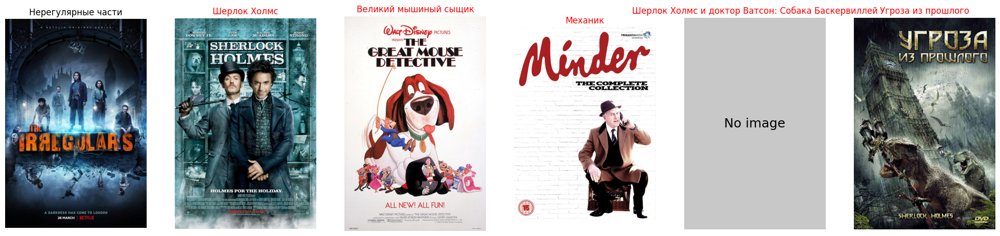

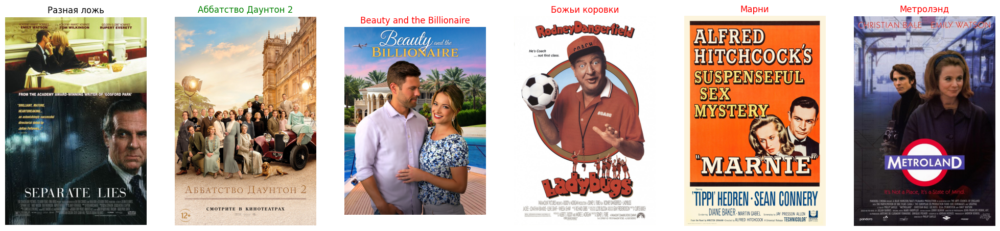

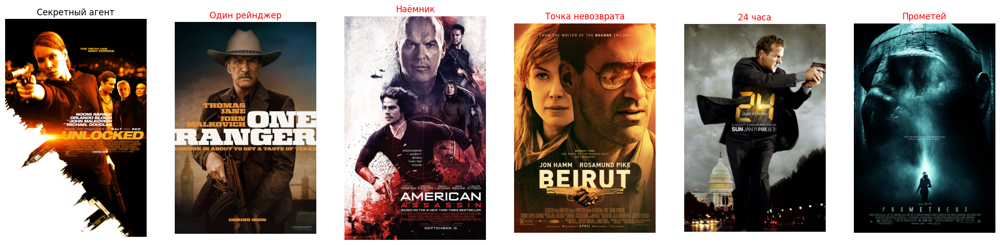

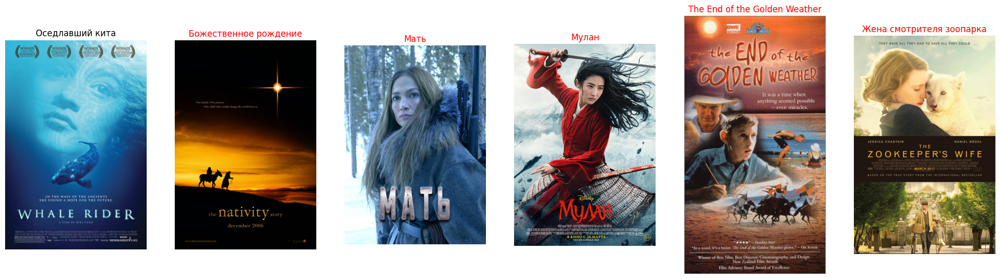

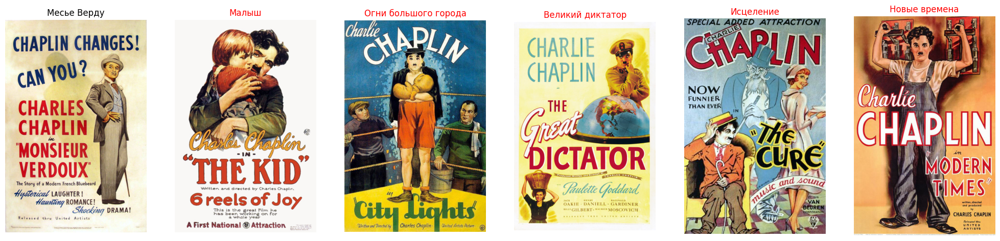

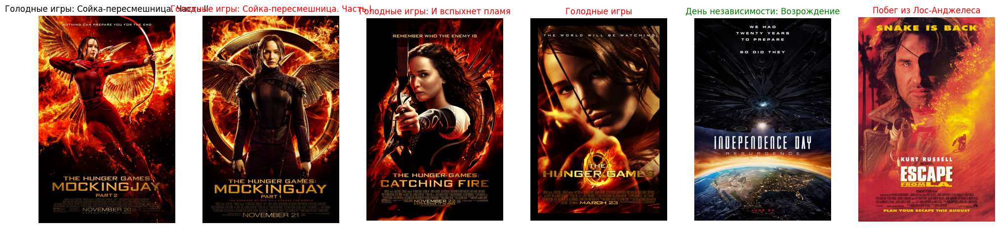

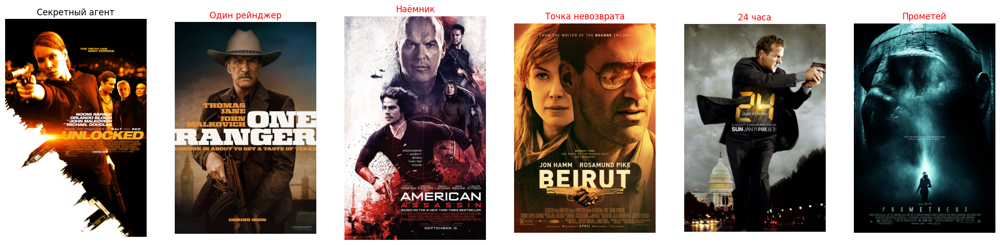

/opt/anaconda3/envs/hml_recsys/lib/python3.11/site-packages/PIL/Image.py:3368: DecompressionBombWarning: Image size (97224000 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


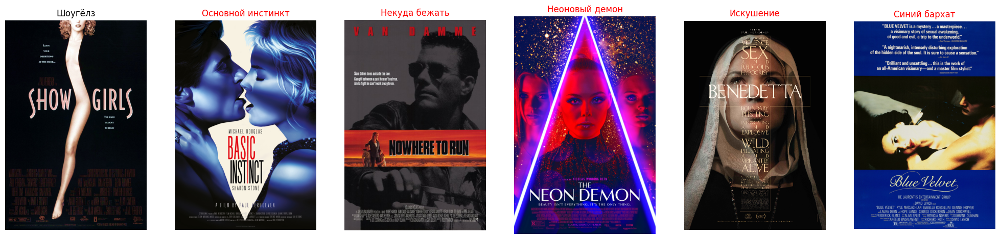

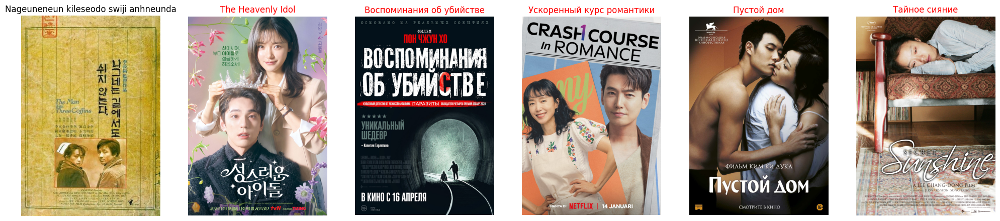

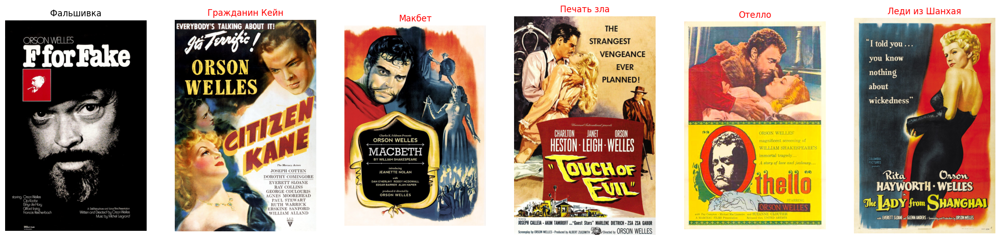

In [33]:
# Define the size of the "No image" placeholder
placeholder_size = (200, 300)  # Example size, adjust as needed

random_ids = np.random.randint(movies_df.shape[0], size=10)
random_movies = movies_df.loc[random_ids, "title_id"]

k = 5
for title_id in random_movies:
    fig, axs = plt.subplots(1, k + 1, figsize=(25, 10))

    # Find the index of the target movie
    title_ind = movies_df["title_id"].to_list().index(title_id)

    # Get the relevant titles for the target movie
    relevant_titles = (
        relevant_titles_df[relevant_titles_df["title_id"] == title_id][
            "relevant_titles"
        ]
        .explode()
        .tolist()
    )

    # Visualize the target movie
    url = movies_df.loc[title_ind, "poster_url"]
    try:
        im = Image.open(requests.get(url, stream=True).raw)
    except UnidentifiedImageError:
        im = None  # If the image is not found or can't be loaded

    if im:
        axs[0].imshow(im)
    else:
        # Create a "No image" placeholder with the same size as other images
        placeholder_img = Image.new("RGB", placeholder_size, (200, 200, 200))
        axs[0].imshow(placeholder_img)
        # Centrally align the "No image" text within the placeholder
        axs[0].text(
            0.5,
            0.5,
            "No image",
            fontsize=18,
            ha="center",
            va="center",
            color="black",
            transform=axs[
                0
            ].transAxes,  # Ensure the text is aligned relative to the axis
        )
    axs[0].axis("off")
    axs[0].set_title(movies_df["name"][title_ind])

    # Build the recommendations
    nearest_inds = I[title_ind][:k]
    recs_posters = movies_df.loc[nearest_inds, "poster_url"]
    recs_names = movies_df.loc[nearest_inds, "name"]
    recs_title_ids = movies_df.loc[nearest_inds, "title_id"].values

    # Visualize the recommendations
    for i, (url, name) in enumerate(zip(recs_posters, recs_names)):
        try:
            im = Image.open(requests.get(url, stream=True).raw)
        except UnidentifiedImageError:
            im = None  # If the image is not found or can't be loaded

        if im:
            axs[1 + i].imshow(im)
        else:
            # Use the same "No image" placeholder for missing images
            placeholder_img = Image.new("RGB", placeholder_size, (200, 200, 200))
            axs[1 + i].imshow(placeholder_img)
            axs[1 + i].text(
                0.5,
                0.5,
                "No image",
                fontsize=18,
                ha="center",
                va="center",
                color="black",
                transform=axs[
                    1 + i
                ].transAxes,  # Ensure the text is aligned relative to the axis
            )
        axs[1 + i].axis("off")
        axs[1 + i].set_title(
            name, color=("g" if recs_title_ids[i] in relevant_titles else "r")
        )

    plt.show()